## importowanie paczek

In [192]:
import os
import random
import pydicom
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
import ast
import math
warnings.filterwarnings('ignore')

## ładowanie ramek danych

In [465]:
path = "D:/pd1/siim-covid19-detection/train"
df = pd.read_csv ('D:/pd1/siim-covid19-detection/train_image_level.csv')
df2 = pd.read_csv ('D:/pd1/siim-covid19-detection/train_study_level.csv')

In [265]:
columns = [
 'SOPInstanceUID',
 'AccessionNumber',
 'BodyPartExamined',
 'Columns',
 'DeidentificationMethod',
 'ImageType',
 'ImagerPixelSpacing',
 'InstanceNumber',
 'Modality',
 'PatientID',
 'PatientName',
 'PatientSex',
 'PixelRepresentation',
 'Rows',
 'SeriesInstanceUID',
 'StudyDate',
 'StudyInstanceUID',
 'StudyTime']

In [266]:
def Metadata_for_Study(folder_path):
    columns = [
 'SOPInstanceUID',
 'AccessionNumber',
 'BodyPartExamined',
 'Columns',
 'DeidentificationMethod',
 'ImageType',
 'ImagerPixelSpacing',
 'InstanceNumber',
 'Modality',
 'PatientID',
 'PatientName',
 'PatientSex',
 'PixelRepresentation',
 'Rows',
 'SeriesInstanceUID',
 'StudyDate',
 'StudyInstanceUID',
 'StudyTime']
    files = os.listdir(folder_path)
    ## Add Columns by looping through DICOM attributes for each image file:
    paths = [folder_path + '/' + file for file in files]
    slices = []
    
    dataframe = pd.DataFrame(columns = columns)
    for path in paths:
        photoID = os.listdir(path)[0]
        ds = pydicom.dcmread(path + "/" + photoID)
        photoID = photoID[0:12]
        elements = []
        for col in columns:
            elements.append(ds.get(col))
        dataframe.loc[len(dataframe)] = elements
    return(dataframe)

In [423]:
def accessPhoto(study, boxes = False, figx = 10, figy = 10, withMeta = False):
    path = "D:/pd1/siim-covid19-detection/train" + "/" + study[0:12]
    for s in os.listdir(path):
        
        imgpath = path + "/" + s
        img = os.listdir(imgpath)[0]
        imgpath += "/" + img
        if(withMeta):
            studyMeta = metadata.loc[metadata["StudyInstanceUID"] == study[0:12]]
            imgMeta = studyMeta.loc[studyMeta["SOPInstanceUID"] == img[0:12]]
            display(imgMeta)
#             df["id"]=df["id"].apply(lambda x: x[0:12])
#             df.loc[df["id"] == img[0:12]]
            
        plt.figure()
        fig, ax = plt.subplots(figsize=(figx,figy))
        ds = pydicom.dcmread(imgpath)
        ax.imshow(ds.pixel_array, cmap=plt.cm.bone)
        
        if not boxes:
            plt.imshow(ds.pixel_array, cmap=plt.cm.bone)
            pass
        tmp = df.loc[df["StudyInstanceUID"]==study]
        if len(tmp) == 0:
            pass
        else:
            tmp = tmp.loc[tmp["id"]== img[0:12]+"_image"]
            if len(tmp) == 0:
                pass
            else:
                string_dict = tmp["boxes"].array[0]
                if isinstance(string_dict, float):
                    pass
                else:
                    boxes = ast.literal_eval(string_dict)
                    for box in boxes:
                        rect = patches.Rectangle((int(box.pop("x")), int(box.pop("y"))), int(box.pop("width")),
                                        int(box.pop("height")), linewidth=1, edgecolor='r', facecolor='none')
                        ax.add_patch(rect)
                plt.show()


In [445]:
metadata = pd.DataFrame(columns = columns)
for study in df["StudyInstanceUID"]:
    meta = Metadata_for_Study(path + "/" + study)
    metadata = metadata.append(meta)
col = metadata.columns
col = [col[5], col[6]]
metadata[col[0]] = metadata[col[0]].apply(lambda x: tuple([p for p in x]))
metadata[col[1]] = metadata[col[0]].apply(lambda x: tuple([p for p in x]))
metadata.drop_duplicates(inplace = True, ignore_index=True)
metadata

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
0,000a312787f2,f6cd7f2019f5,CHEST,4256,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,dcc3fdf6426a,"(d, 4, 2, 6, 8, f, 2, 6, e, d, 0, 5)",M,0,3488,81456c9c5423,526316e376d4,5776db0cec75,8ccfb6acf07f
1,000c3a3f293f,1c2708371bc6,CHEST,2832,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,CR,f09ff9b7dab3,"(e, f, 8, c, 3, 1, f, 8, d, f, d, d)",M,0,2320,d8a644cc4f93,d09eda152722,ff0879eb20ed,543adb46f494
2,0012ff7358bc,99428f65d948,PORT CHEST,3056,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",1,DX,6a02c0731039,"(2, f, 2, f, b, 9, 4, 4, f, e, 4, 4)",F,0,2544,22897cd1daa0,96fc21dd2b1f,9d514ce429a7,746186a2bbf2
3,001398f4ff4f,7b889627faf1,CHEST,4280,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY, POST_PROCESSED, RT, , , , ,...","(DERIVED, PRIMARY, POST_PROCESSED, RT, , , , ,...",1002,CR,db63d9b7f61c,"(9, c, c, d, 8, 7, b, 4, 5, 1, 1, b)",F,0,3520,4d47bc042ee6,3f094e1700ec,28dddc8559b2,9c4f53a2d5e4
4,001bd15d1891,e9d93edf50c6,CHEST,3408,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,605693f36f43,"(3, 5, b, f, 9, d, d, b, f, 9, e, 9)",M,0,2800,49170afa4f27,a69d89c8a474,dfd9fdd85a3e,5399ff949226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6326,ffcc6edd9445,b59e1d549ba8,CHEST,3480,CTP Default,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,CR,71b5edab804b,"(7, 1, b, 5, e, d, a, b, 8, 0, 4, b)",F,0,4240,98011bca5fd2,33a273c2a42d,7e6c68462e06,f08baa3f192e
6327,ffd91a2c4ca0,9e408c43d694,CHEST,3408,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,41397b2c9d10,"(0, 0, 3, 8, 4, 1, a, 2, 7, c, 2, c)",F,0,2800,f346cda52da0,77a1800cc83e,8332bdaddb6e,4acb15bd0739
6328,ffd9b6cf2961,7b0014a6956c,TORAX,3050,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",1,DX,19ca51007544,"(5, 9, d, d, f, a, 7, 7, 5, d, 3, 7)",M,0,2388,668a64e3a5fa,5c32e85f2c8a,7eed9af03814,6362e588f5f9
6329,ffdc682f7680,667774b0cf64,CHEST,4256,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",2,DX,eb981a5bc177,"(4, 6, 2, 9, 9, 9, 7, b, 8, 2, 7, 4)",M,0,3488,ccf363aa080f,dfa2a3be3b32,a0cb0b96fb3d,7c6f6f8112be


## analiza danych tabelarycznych

### czy są puste wiersze?

In [410]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7082 entries, 0 to 0
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   SOPInstanceUID          7082 non-null   object
 1   AccessionNumber         7082 non-null   object
 2   BodyPartExamined        7082 non-null   object
 3   Columns                 7082 non-null   object
 4   DeidentificationMethod  7082 non-null   object
 5   ImageType               7082 non-null   object
 6   ImagerPixelSpacing      7082 non-null   object
 7   InstanceNumber          6789 non-null   object
 8   Modality                7082 non-null   object
 9   PatientID               7082 non-null   object
 10  PatientName             7082 non-null   object
 11  PatientSex              7082 non-null   object
 12  PixelRepresentation     7082 non-null   object
 13  Rows                    7082 non-null   object
 14  SeriesInstanceUID       7082 non-null   object
 15  StudyDa

In [411]:
metadata.describe()

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
count,7082,7082,7082,7082,7082,7082,7082,6789,7082,7082,7082,7082,7082,7082,7082,7082,7082,7082
unique,6331,6054,12,546,3,15,15,9,2,3261,3247,2,1,584,6331,482,6054,5861
top,bee62c601ae9,88eaab92365f,CHEST,2836,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,b3c0c7ed9a98,"(1, d, 2, 4, 7, 1, c, b, 6, a, d, 1)",M,0,3480,ad6876d5e56a,2fb8dbe78524,0fd2db233deb,97af3f0f1be3
freq,9,81,5671,719,6471,3891,3891,6648,3597,81,81,4072,7082,1016,9,266,81,81


In [321]:
df

,id,boxes,label,StudyInstanceUID
0,000a312787f2_image,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75
1,000c3a3f293f_image,NaN,none 1 0 0 1 1,ff0879eb20ed
2,0012ff7358bc_image,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7
3,001398f4ff4f_image,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2
4,001bd15d1891_image,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e
...,...,...,...,...
6329,ffcc6edd9445_image,NaN,none 1 0 0 1 1,7e6c68462e06
6330,ffd91a2c4ca0_image,NaN,none 1 0 0 1 1,8332bdaddb6e
6331,ffd9b6cf2961_image,"[{'x': 2197.38566, 'y': 841.07361, 'width': 31...",opacity 1 2197.38566 841.07361 2513.80265 1292...,7eed9af03814
6332,ffdc682f7680_image,"[{'x': 2729.27083, 'y': 332.26044, 'width': 14...",opacity 1 2729.27083 332.26044 4225.52099 2936...,a0cb0b96fb3d


In [322]:
df2

,id,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance
0,00086460a852_study,0,1,0,0
1,000c9c05fd14_study,0,0,0,1
2,00292f8c37bd_study,1,0,0,0
3,005057b3f880_study,1,0,0,0
4,0051d9b12e72_study,0,0,0,1
...,...,...,...,...,...
6049,ffcb4630f46f_study,0,1,0,0
6050,ffe4d6e8fbb0_study,0,1,0,0
6051,ffe94fcb14fa_study,0,1,0,0
6052,ffebf1ef4a9c_study,0,1,0,0


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6334 entries, 0 to 6333
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                6334 non-null   object
 1   boxes             4294 non-null   object
 2   label             6334 non-null   object
 3   StudyInstanceUID  6334 non-null   object
dtypes: object(4)
memory usage: 198.1+ KB


In [36]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6054 entries, 0 to 6053
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   id                        6054 non-null   object
 1   Negative for Pneumonia    6054 non-null   int64 
 2   Typical Appearance        6054 non-null   int64 
 3   Indeterminate Appearance  6054 non-null   int64 
 4   Atypical Appearance       6054 non-null   int64 
dtypes: int64(4), object(1)
memory usage: 236.6+ KB


mamy braki danych w kolumnie `boxes` w ramce `train_image`  
nie ma braków danych w ramce `train_study`

w treningowym zbiorze zdjęć mamy 6054 foldery

In [38]:
df.describe()

,id,boxes,label,StudyInstanceUID
count,6334,4294,6334,6334
unique,6334,4294,4295,6054
top,000a312787f2_image,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",none 1 0 0 1 1,0fd2db233deb
freq,1,1,2040,9


Czy są powtarzające się wartości?

In [39]:
df.groupby("label").count().head()

,id,boxes,StudyInstanceUID
label,,,
none 1 0 0 1 1,2040,0,2040
opacity 1 -3.55558 1608.94276 1382.24912 3394.04713 opacity 1 1938.1369 1507.16049 3590.14129 3159.1650099999997,1,1,1
opacity 1 0 0 825.92002 1685.86667 opacity 1 1750.05336 46.4 2411.25336 1910.1333300000001,1,1,1
opacity 1 0 1248.50407 596.62985 1754.12553 opacity 1 1336.70152 1412.33673 2110.66953 1898.18524,1,1,1
opacity 1 0 133.98 1105.335 1860.83333 opacity 1 1243.65702 148.86667 2398.7416700000003 1901.77167,1,1,1


`label` none 1 0 0 1 1 powtarza się

72% pacjentów choruje na zapalnie płuc, u 47% nie stwierdzono żadnych nieprawidłowości na zdjęciach

Ile mamy zdjęć mężczyzn, ile kobiet?

In [450]:
metadata.groupby("PatientSex").count()

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
PatientSex,,,,,,,,,,,,,,,,,
F,2769,2769,2769,2769,2769,2769,2769,2686,2769,2769,2769,2769,2769,2769,2769,2769,2769
M,3562,3562,3562,3562,3562,3562,3562,3388,3562,3562,3562,3562,3562,3562,3562,3562,3562


Jest 2769 zdjęć kobiet, 3562 zdjęcia mężczyzn

u ilu pacjentów chorych stwierdzono atypowość?

In [44]:
df2.loc[df2['Negative for Pneumonia'] == 0,:].describe()

,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance
count,4378.0,4378.000000,4378.000000,4378.000000
mean,0.0,0.652124,0.239607,0.108269
std,0.0,0.476351,0.426892,0.310755
min,0.0,0.000000,0.000000,0.000000
25%,0.0,0.000000,0.000000,0.000000
50%,0.0,1.000000,0.000000,0.000000
75%,0.0,1.000000,0.000000,0.000000
max,0.0,1.000000,1.000000,1.000000


u 11% pacjentów chorych obserwowano nietypowy wygląd  
a jak wygląda sytuacja dla zdrowych pacjentów?

In [45]:
df2.loc[df2['Negative for Pneumonia'] == 1,:].describe()

,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance
count,1676.0,1676.0,1676.0,1676.0
mean,1.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0
min,1.0,0.0,0.0,0.0
25%,1.0,0.0,0.0,0.0
50%,1.0,0.0,0.0,0.0
75%,1.0,0.0,0.0,0.0
max,1.0,0.0,0.0,0.0


wszystkie rekordy pacjentów zdrowych są identyczne, z wyjątkiem id - mają wartość 0 w każdej z trzech kolumn dotyczących "appearance". Czy są zdjęcia dla tych pacjentów?

### pora zajrzeć do zdjęć

In [76]:
negatives = df2.loc[df2['Negative for Pneumonia'] == 1,:].reset_index(drop = True)

study = negatives["id"][random.randint(0, len(negatives["id"]))]
photos = accessPhoto(study)
plt.show()

mamy zdjęcia dla zdrowych, nie ma u nich jednak danych dotyczących wyglądu.  
  
Czy są pacjenci, którzy mają więcej niż jedno zdjęcie?

In [343]:
tmp = df.groupby("StudyInstanceUID").count()
multiple = tmp.loc[tmp["id"] > 1].sort_values("id", ascending = False).reset_index()
multiple.head()

,StudyInstanceUID,id,boxes,label
0,0fd2db233deb,9,1,9
1,a7335b2f9815,7,1,7
2,8943d1d85097,6,1,6
3,a4e94133d95a,5,1,5
4,970c96c9fa5d,5,1,5


tak, jest ich 232

<Figure size 432x288 with 0 Axes>

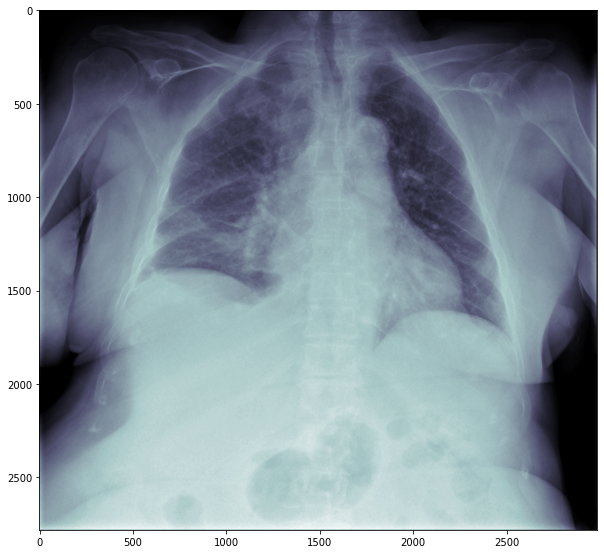

<Figure size 432x288 with 0 Axes>

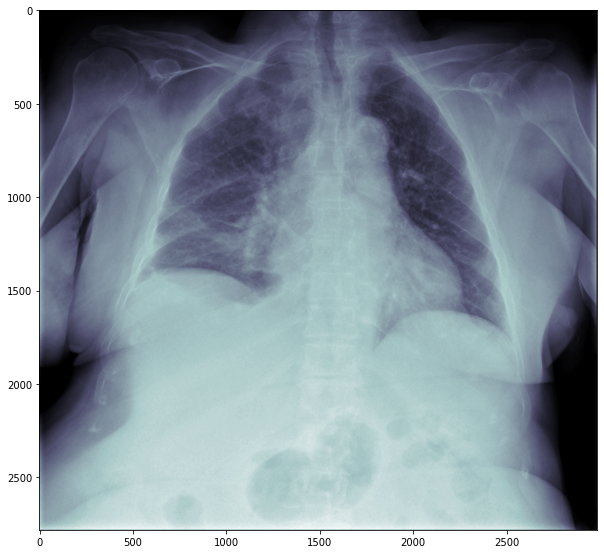

<Figure size 432x288 with 0 Axes>

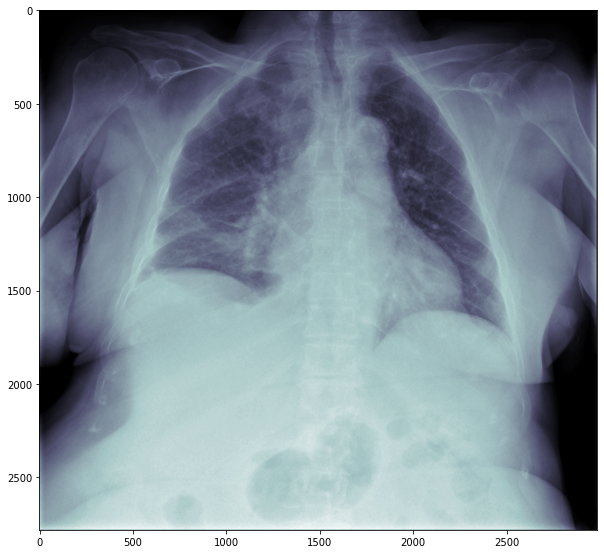

<Figure size 432x288 with 0 Axes>

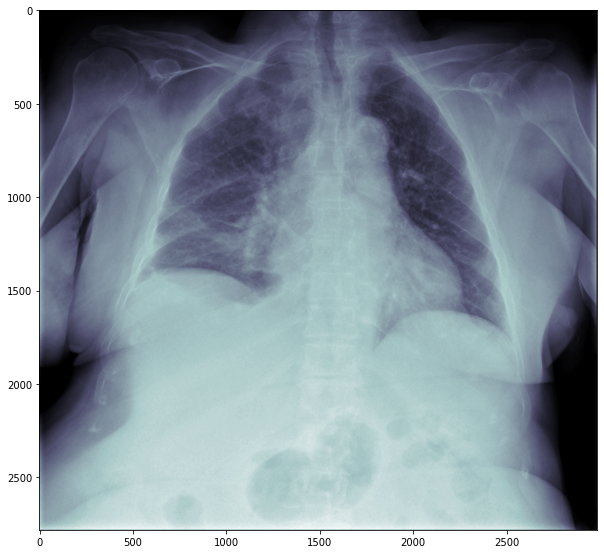

<Figure size 432x288 with 0 Axes>

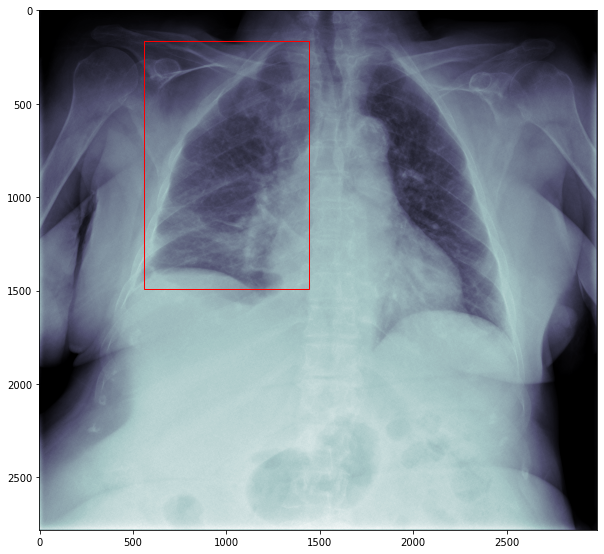

<Figure size 432x288 with 0 Axes>

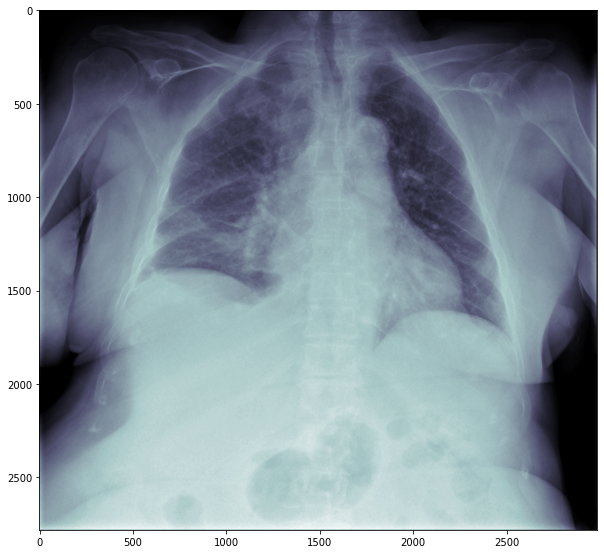

<Figure size 432x288 with 0 Axes>

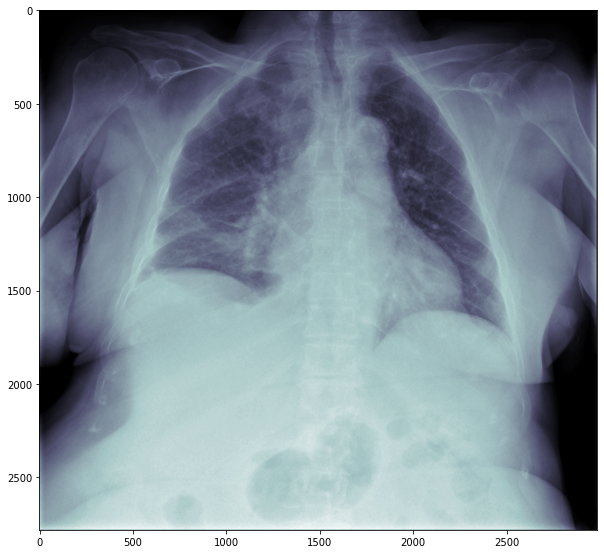

<Figure size 432x288 with 0 Axes>

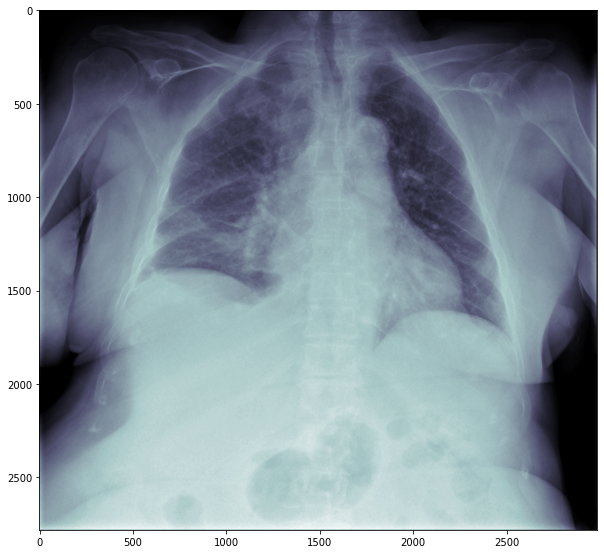

<Figure size 432x288 with 0 Axes>

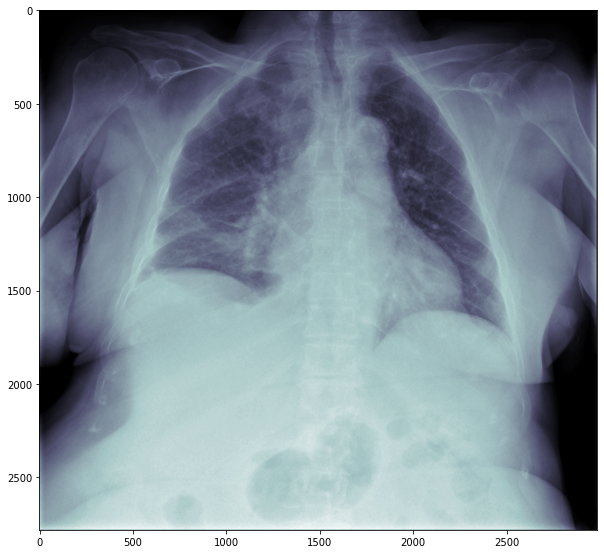

In [318]:
accessPhoto("0fd2db233deb", True)

jak wyglądają zdjęcia pacjentów ze stwierdzoną atypowością?

In [412]:
atypical = df2.loc[df2["Atypical Appearance"] == 1].reset_index(drop = True)
tmp = atypical
tmp["id"] = tmp["id"].apply(lambda x: x[0:12])
bools = tmp["id"].isin(multiple["StudyInstanceUID"])
atypical = tmp.loc[bools].reset_index(drop = True)
atypical

,id,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance
0,00f9e183938e,0,0,0,1
1,0d9709b3af74,0,0,0,1
2,26648048b098,0,0,0,1
3,2c78ef584129,0,0,0,1
4,6e550fa78c6d,0,0,0,1
5,76b5e2db22ba,0,0,0,1
6,784afbafee30,0,0,0,1


mamy 7 pacjentów ze stwierdzoną atypowością, posiadających wiele zdjęć.

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2638,6534a837497d,e7dcbdcd8d56,PORT CHEST,3056,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",1,DX,e1f603f0e590,"(7, 0, 1, f, 9, c, 9, d, e, 7, 2, b)",F,0,2544,081e92373dc6,445a5343ecda,00f9e183938e,5ade2083e1a4


<Figure size 432x288 with 0 Axes>

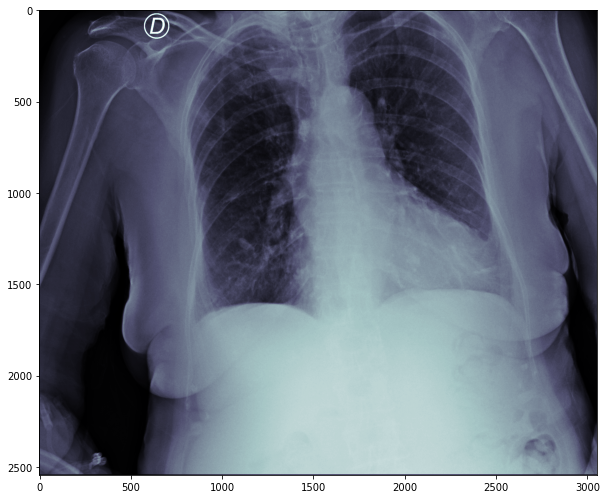

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2639,74077a8e3b7c,e7dcbdcd8d56,PORT CHEST,3056,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",1,DX,e1f603f0e590,"(7, 0, 1, f, 9, c, 9, d, e, 7, 2, b)",F,0,2544,89bad86310f9,445a5343ecda,00f9e183938e,5ade2083e1a4


<Figure size 432x288 with 0 Axes>

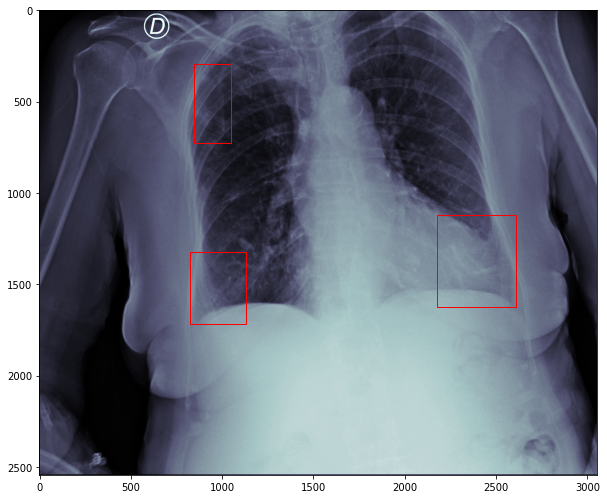

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
239,0842f032a217,499aedc4d2ee,CHEST,3001,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY, )","(ORIGINAL, PRIMARY, )",1,CR,5ebbd93cc0e6,"(b, 2, 7, 4, 2, 3, f, 0, c, 4, 4, 4)",M,0,3001,094a086f0e1b,8462bbf3a2c2,0d9709b3af74,8de83721b22e


<Figure size 432x288 with 0 Axes>

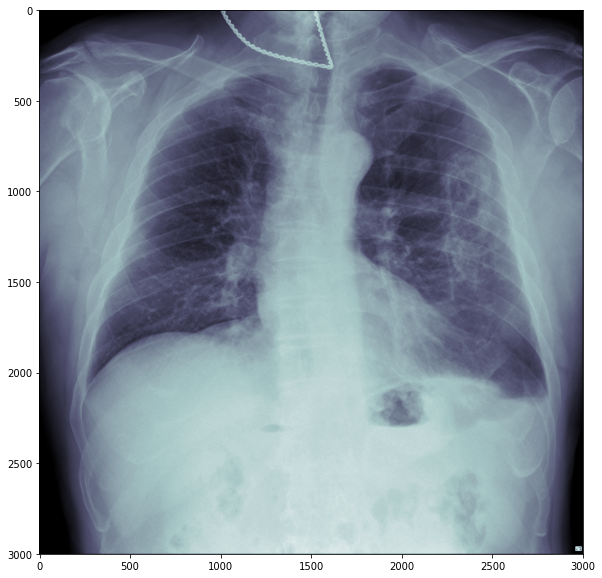

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
240,830063223a31,499aedc4d2ee,CHEST,3001,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY, )","(ORIGINAL, PRIMARY, )",1,CR,5ebbd93cc0e6,"(b, 2, 7, 4, 2, 3, f, 0, c, 4, 4, 4)",M,0,3001,4e7268348ca6,8462bbf3a2c2,0d9709b3af74,8de83721b22e


<Figure size 432x288 with 0 Axes>

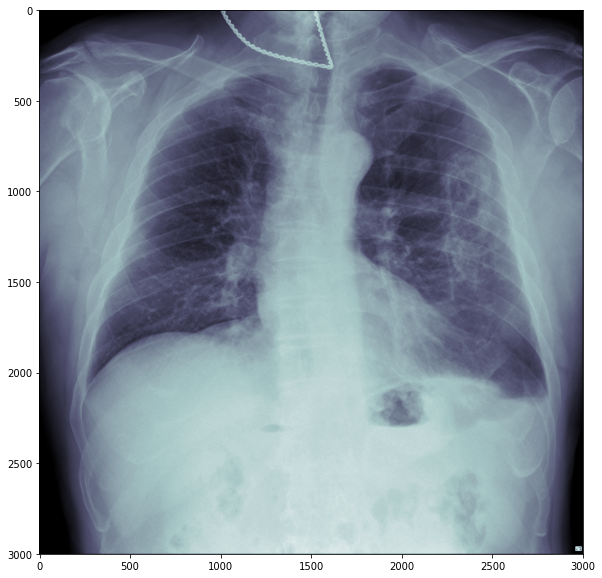

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
241,efc93a3917b6,499aedc4d2ee,CHEST,3001,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY, )","(ORIGINAL, PRIMARY, )",1,CR,5ebbd93cc0e6,"(b, 2, 7, 4, 2, 3, f, 0, c, 4, 4, 4)",M,0,3001,8a562374d8d6,8462bbf3a2c2,0d9709b3af74,8de83721b22e


<Figure size 432x288 with 0 Axes>

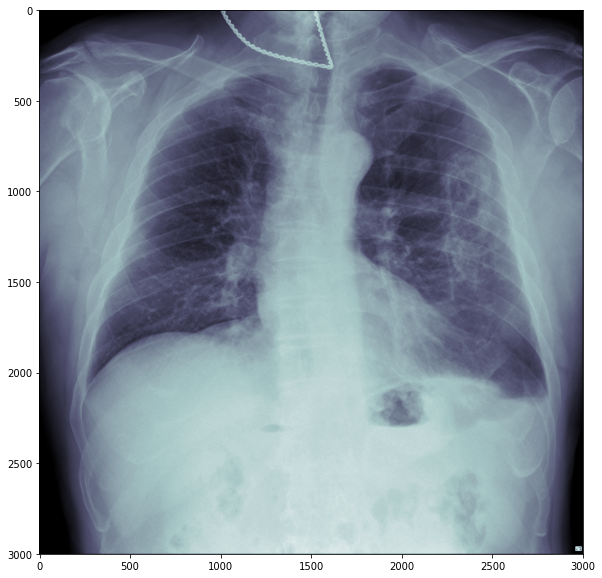

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2345,f689d30c2f86,99fd626fff87,CHEST,2880,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",None,DX,22d37f9195e5,"(b, 3, c, 3, b, f, b, 0, d, e, 5, 6)",M,0,2540,101bc53bc385,ddf027d7b0c3,26648048b098,bb8bc6ea34d3


<Figure size 432x288 with 0 Axes>

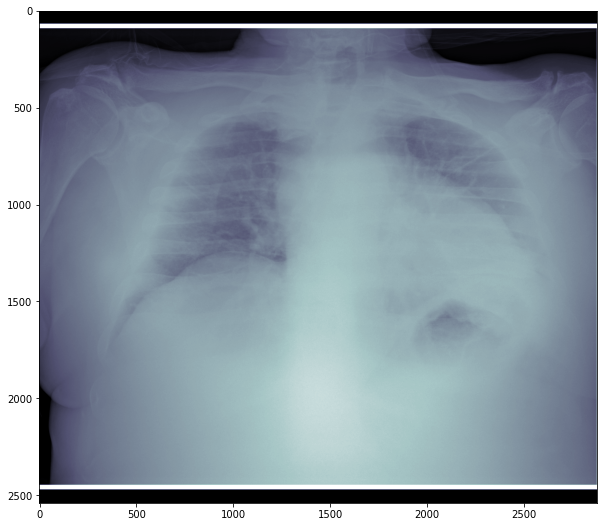

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2346,66b86b95c76a,99fd626fff87,CHEST,2880,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",None,DX,22d37f9195e5,"(b, 3, c, 3, b, f, b, 0, d, e, 5, 6)",M,0,2540,3c1e53db615a,ddf027d7b0c3,26648048b098,bb8bc6ea34d3


<Figure size 432x288 with 0 Axes>

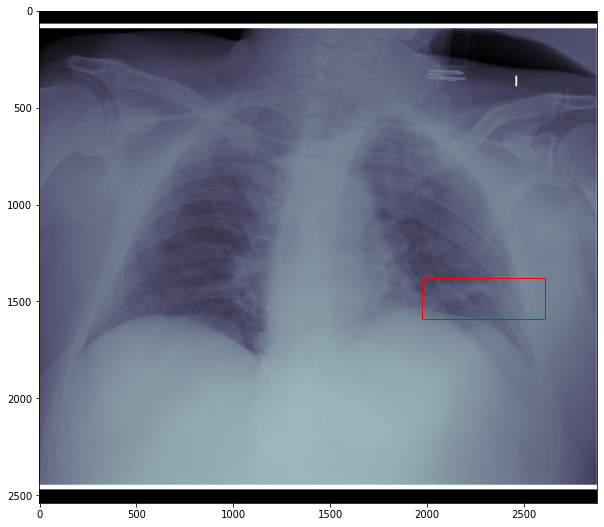

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2347,59bd5a00b33e,99fd626fff87,CHEST,2880,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",None,DX,22d37f9195e5,"(b, 3, c, 3, b, f, b, 0, d, e, 5, 6)",M,0,2540,c38d2ec8448b,ddf027d7b0c3,26648048b098,bb8bc6ea34d3


<Figure size 432x288 with 0 Axes>

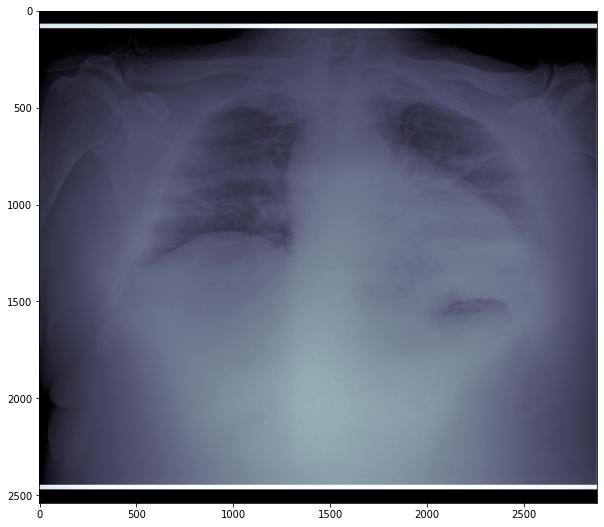

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1377,8d95766f633e,e7ee7934820f,CHEST,2880,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",None,DX,a39d84caf95d,"(d, c, 5, 3, 0, a, 1, 8, c, c, 9, 5)",M,0,2400,1c49f7dc7a35,3e03422c6a9b,2c78ef584129,d6f6aa6ad0a9


<Figure size 432x288 with 0 Axes>

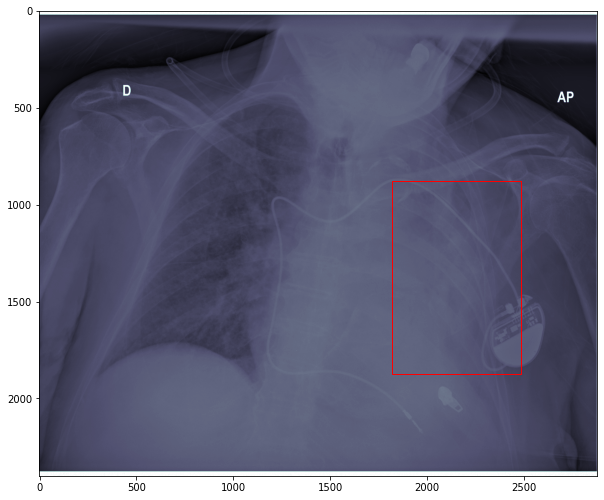

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1378,33a72bfb5ddb,e7ee7934820f,CHEST,2544,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",None,DX,a39d84caf95d,"(d, c, 5, 3, 0, a, 1, 8, c, c, 9, 5)",M,0,2028,518b4bfa9a7a,3e03422c6a9b,2c78ef584129,d6f6aa6ad0a9


<Figure size 432x288 with 0 Axes>

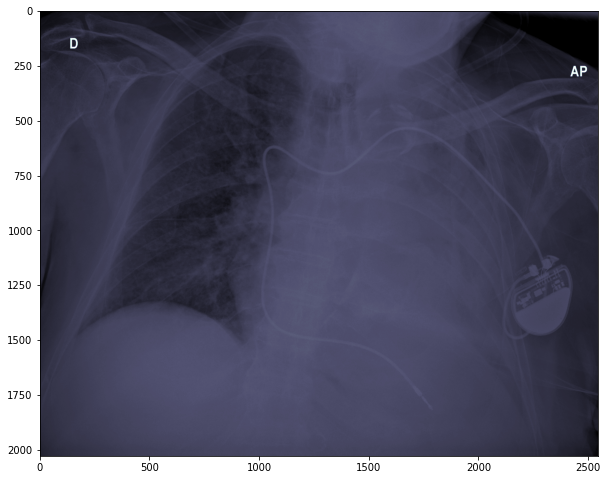

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1748,bea7d86f79d5,71fef73cb2f2,CHEST,3408,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,fe72b523bbaa,"(2, 3, 9, 9, f, f, 0, 2, e, d, f, f)",M,0,2800,0d08c9195b1b,d99077eb7605,6e550fa78c6d,0efc49305e90


<Figure size 432x288 with 0 Axes>

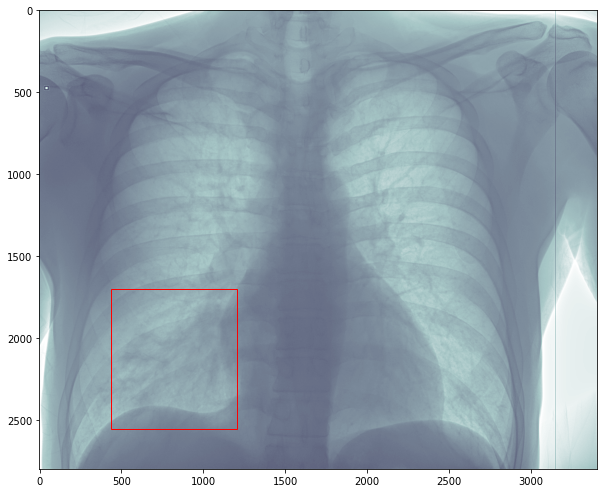

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1749,424118f1afc8,71fef73cb2f2,CHEST,3408,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,fe72b523bbaa,"(2, 3, 9, 9, f, f, 0, 2, e, d, f, f)",M,0,2800,898adfe29ad9,d99077eb7605,6e550fa78c6d,0efc49305e90


<Figure size 432x288 with 0 Axes>

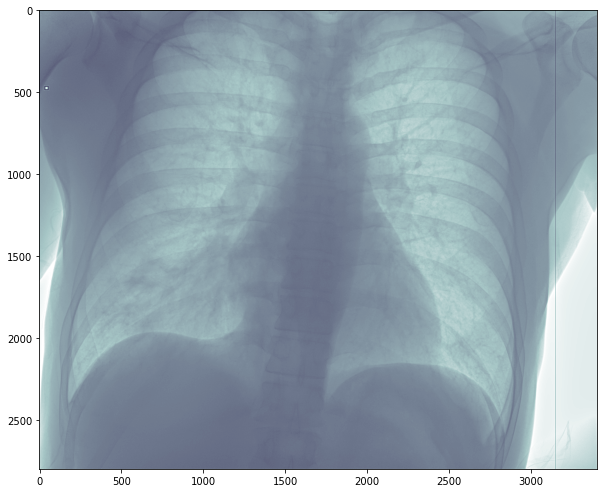

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
748,fa447a409bd6,e5e924503bb7,CHEST,3408,RSNA Covid-19 Dataset Default,"(DERIVED, PRIMARY, )","(DERIVED, PRIMARY, )",1,DX,fde2e622c5da,"(f, d, e, 2, e, 6, 2, 2, c, 5, d, a)",M,0,2800,234e99174aa1,9d6750c5a628,76b5e2db22ba,ca6451a856a3


<Figure size 432x288 with 0 Axes>

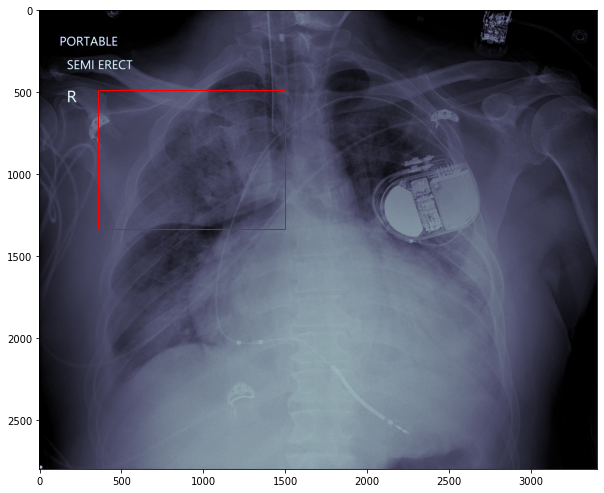

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
749,1b92142f4362,e5e924503bb7,CHEST,3408,RSNA Covid-19 Dataset Default,"(DERIVED, PRIMARY, )","(DERIVED, PRIMARY, )",1,DX,fde2e622c5da,"(f, d, e, 2, e, 6, 2, 2, c, 5, d, a)",M,0,2800,504c0e3fe488,9d6750c5a628,76b5e2db22ba,ca6451a856a3


<Figure size 432x288 with 0 Axes>

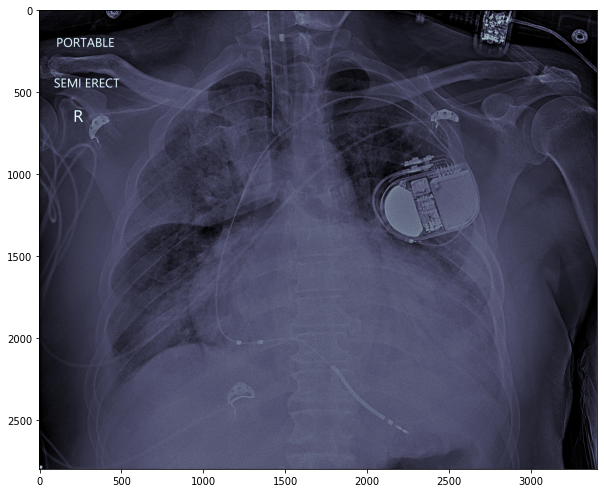

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2303,57bf106a9e2e,8d52058580fb,CHEST,3408,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY, )","(DERIVED, PRIMARY, )",1,DX,288622555fb8,"(2, 3, f, 4, d, 8, 9, a, 6, d, 1, c)",M,0,3320,2734dce96fcb,364e93fa20e4,784afbafee30,86b8fb53e424


<Figure size 432x288 with 0 Axes>

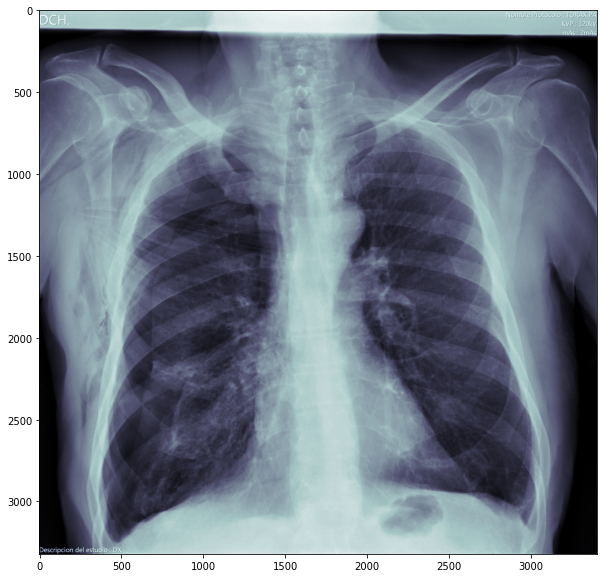

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2304,7f11df4026e3,8d52058580fb,CHEST,3408,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY, )","(DERIVED, PRIMARY, )",1,DX,288622555fb8,"(2, 3, f, 4, d, 8, 9, a, 6, d, 1, c)",M,0,3320,54a7b3303150,364e93fa20e4,784afbafee30,86b8fb53e424


<Figure size 432x288 with 0 Axes>

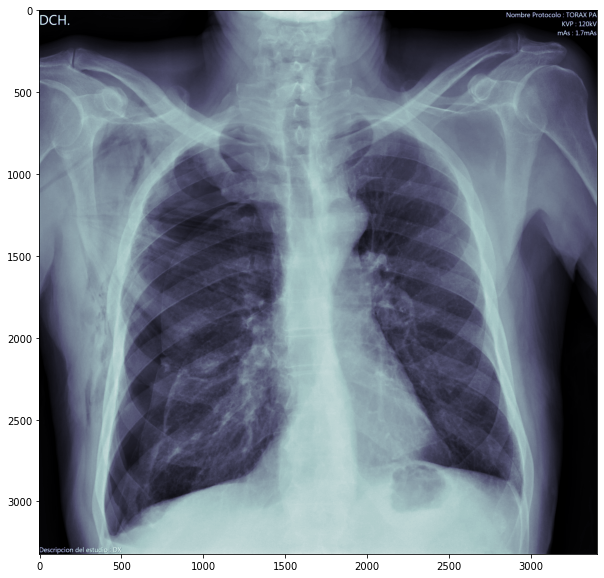

In [447]:
for study in atypical["id"]:
    accessPhoto(study, True, withMeta = True)

In [469]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6334 entries, 0 to 6333
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        6334 non-null   object 
 1   boxes                     4294 non-null   object 
 2   label                     6334 non-null   object 
 3   StudyInstanceUID          6334 non-null   object 
 4   Negative for Pneumonia    0 non-null      float64
 5   Typical Appearance        0 non-null      float64
 6   Indeterminate Appearance  0 non-null      float64
 7   Atypical Appearance       0 non-null      float64
dtypes: float64(4), object(4)
memory usage: 396.0+ KB


## detekcja

In [507]:
tmp = df
tmp = tmp.dropna().reset_index(drop = True)
tmp

,id,boxes,label,StudyInstanceUID
0,000a312787f2_image,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75
1,0012ff7358bc_image,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7
2,001398f4ff4f_image,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2
3,001bd15d1891_image,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e
4,0022227f5adf_image,"[{'x': 1857.2065, 'y': 508.30565, 'width': 376...",opacity 1 1857.2065 508.30565 2233.23384 907.8...,84543edc24c2
...,...,...,...,...
4289,ffbeafe30b77_image,"[{'x': 1472.09879, 'y': 1182.64415, 'width': 3...",opacity 1 1472.09879 1182.64415 1773.17398 146...,f75774536369
4290,ffcc16bbf428_image,"[{'x': 2529.03977, 'y': 347.67053, 'width': 58...",opacity 1 2529.03977 347.67053 3113.65526 1484...,5d786634f354
4291,ffd9b6cf2961_image,"[{'x': 2197.38566, 'y': 841.07361, 'width': 31...",opacity 1 2197.38566 841.07361 2513.80265 1292...,7eed9af03814
4292,ffdc682f7680_image,"[{'x': 2729.27083, 'y': 332.26044, 'width': 14...",opacity 1 2729.27083 332.26044 4225.52099 2936...,a0cb0b96fb3d


mamy 4294 badania, w których są `boxes`

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1462,36adbbd65ff4,efb7936860a6,CHEST,2962,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(DERIVED, PRIMARY, )","(DERIVED, PRIMARY, )",1,DX,3f6e2c92677e,"(6, 7, 0, a, e, 8, 7, 2, 6, 1, 4, 5)",M,0,3036,1750f24af96b,e7682f68cdb7,8716e2d245fd,731338783b26


<Figure size 432x288 with 0 Axes>

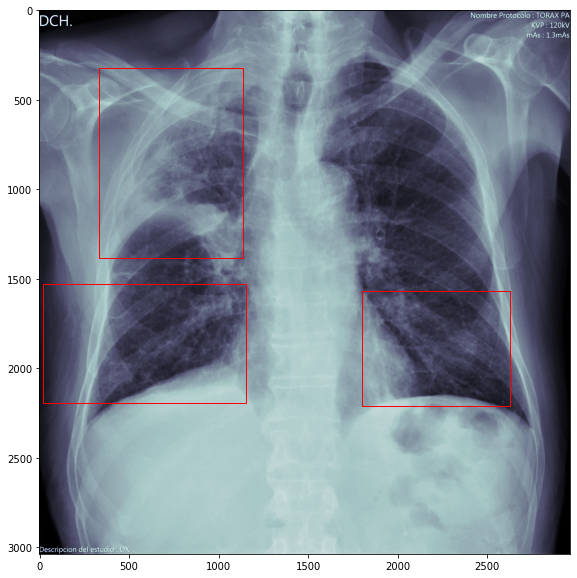

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
3088,76c66ee8e58d,e93f4937537e,CHEST,3388,RSNA Covid-19 Dataset Default,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",1,DX,1b0fe266a5a5,"(1, b, 0, f, e, 2, 6, 6, a, 5, a, 5)",F,0,2963,b67d36eb6f80,8c87899eac90,c29970048923,72340a47790d


,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
3089,7b3e9f13d4e7,e93f4937537e,CHEST,3388,RSNA Covid-19 Dataset Default,"(DERIVED, PRIMARY)","(DERIVED, PRIMARY)",1,DX,1b0fe266a5a5,"(1, b, 0, f, e, 2, 6, 6, a, 5, a, 5)",F,0,2963,fc3ba5dcfffe,8c87899eac90,c29970048923,72340a47790d


<Figure size 432x288 with 0 Axes>

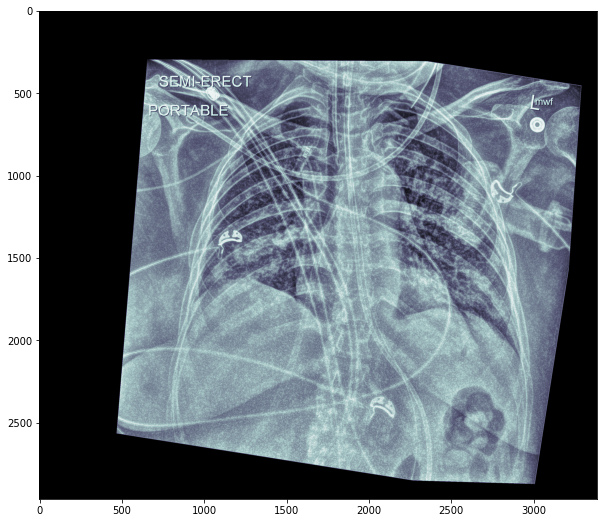

<Figure size 432x288 with 0 Axes>

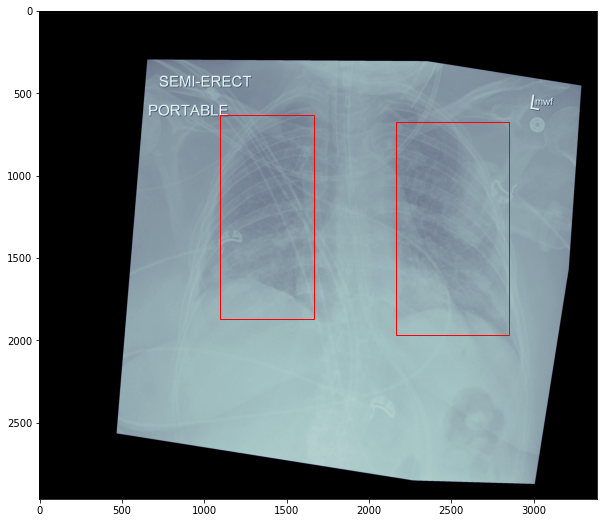

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2983,73363e9b5946,e5dc698daa8e,CHEST,4256,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,7ebbeb00360b,"(9, 3, d, a, b, 0, e, e, 2, 3, c, 8)",M,0,3488,85de6e0a076a,8462bbf3a2c2,74dbd8125c6f,6f96cf94120b


<Figure size 432x288 with 0 Axes>

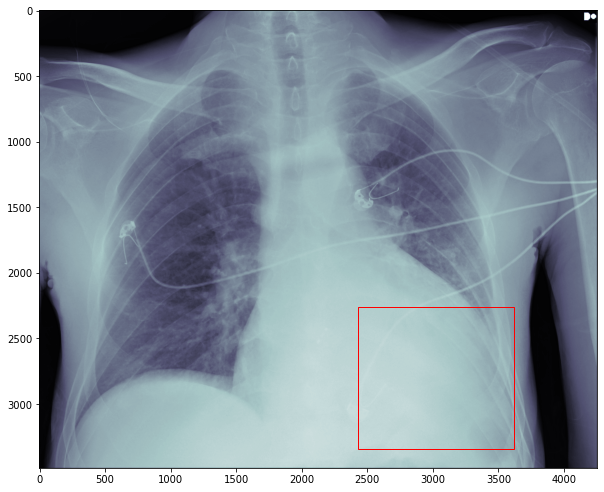

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2446,5d82aae7467a,0969f922ae55,CHEST,2836,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,CR,fec05c196884,"(6, 4, e, 0, e, 5, 7, 1, b, 0, 7, 8)",M,0,2336,245a33f0dd83,837af68926b7,e798c7da0eac,44ac32b3ad41


<Figure size 432x288 with 0 Axes>

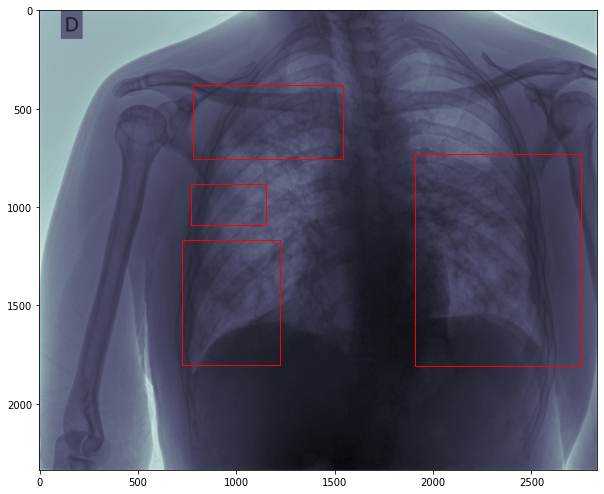

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
4591,b6cd2b51fdbb,6a87173aecad,CHEST,2652,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY, )","(ORIGINAL, PRIMARY, )",1,DX,15c9f18c8f27,"(e, 8, 1, 6, c, a, d, f, d, 9, 4, 9)",F,0,2292,02dbb4117fcd,d99077eb7605,1882d31c20a8,9abe129dc837


<Figure size 432x288 with 0 Axes>

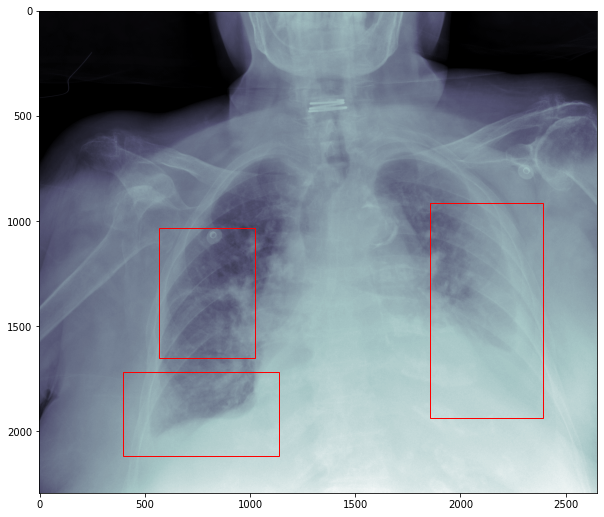

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
5578,ddef2583d5db,42356327c9e5,CHEST,2832,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,CR,ba218565ec33,"(8, d, d, d, 1, d, 3, 1, f, 3, 0, 3)",M,0,2320,951c2ebebe56,4545ba78b753,36746fa2ffc4,2cc9d845ab48


<Figure size 432x288 with 0 Axes>

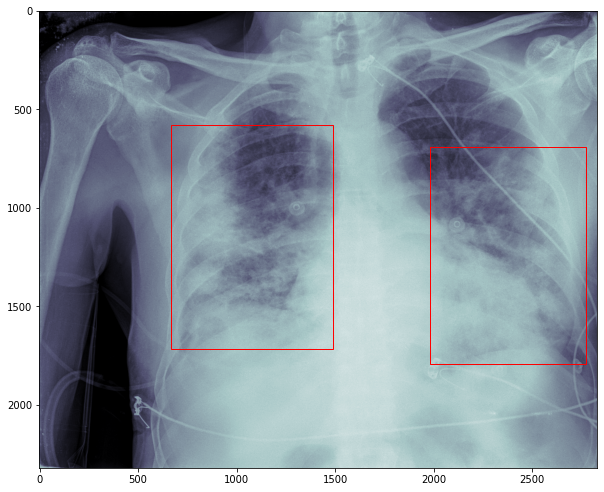

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1071,27c6b4e08f27,cb027624f2ca,CHEST,2836,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,CR,33ff340c5cc8,"(5, 7, 9, e, 4, a, 1, 2, 1, c, 3, d)",M,0,2336,54a7aa5e9d5a,3108070a6130,0845243089f8,454a621959b5


<Figure size 432x288 with 0 Axes>

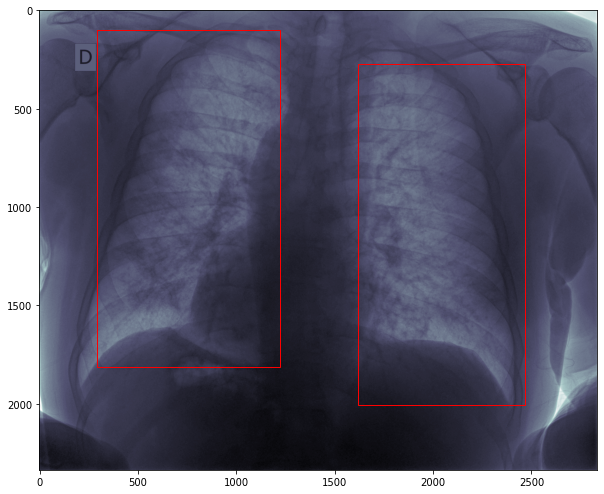

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
41,0133bf9a5f5c,2b0002380547,CHEST,2836,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,d8efa815cd52,"(f, a, 4, 9, 2, f, 5, 9, 8, d, 8, 3)",M,0,2336,b4edc931de85,7e825928c7af,5be2cf346b1e,adc91aab812b


<Figure size 432x288 with 0 Axes>

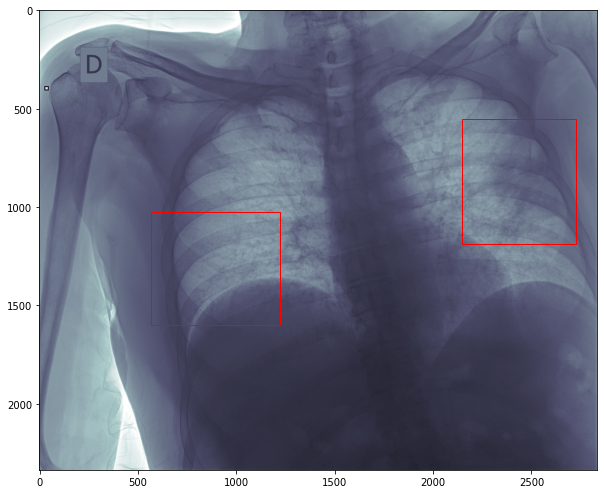

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
2798,6b365e092404,1d268b73abe2,CHEST,3052,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,f5d0dc435d19,"(4, 4, 1, 2, a, 1, b, 1, d, d, e, 9)",M,0,3052,1da97a21cbcc,96fc21dd2b1f,4de6472758de,fa14e31f0c63


<Figure size 432x288 with 0 Axes>

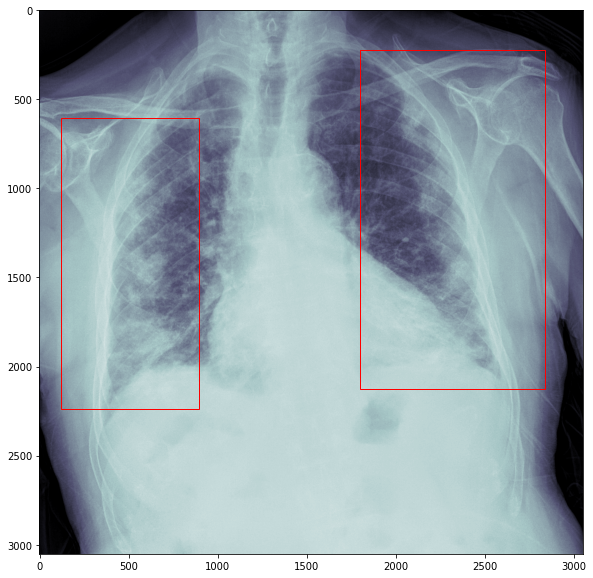

,SOPInstanceUID,AccessionNumber,BodyPartExamined,Columns,DeidentificationMethod,ImageType,ImagerPixelSpacing,InstanceNumber,Modality,PatientID,PatientName,PatientSex,PixelRepresentation,Rows,SeriesInstanceUID,StudyDate,StudyInstanceUID,StudyTime
1407,3491947158e3,93ceccb2163f,CHEST,4256,CTP Default: based on DICOM PS3.15 AnnexE. De...,"(ORIGINAL, PRIMARY)","(ORIGINAL, PRIMARY)",1,DX,dee5f191a907,"(f, 9, 5, 9, 3, d, 7, f, c, 2, 4, d)",M,0,3488,67bc32e08afa,96fc21dd2b1f,d52d402b2246,2784b47e6190


<Figure size 432x288 with 0 Axes>

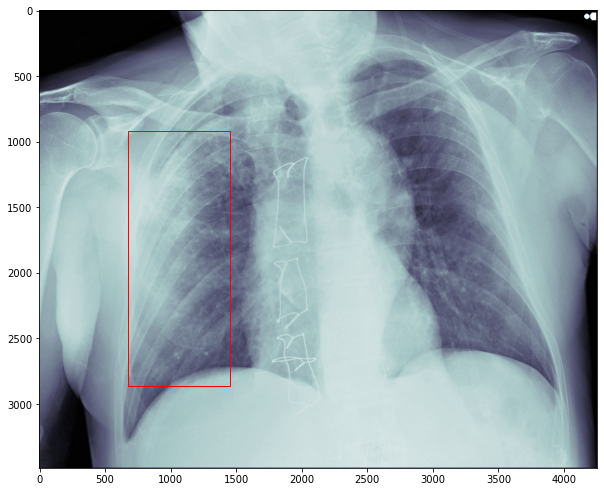

In [508]:
for study in random.sample(tmp["StudyInstanceUID"].tolist(), 10):
    accessPhoto(study, withMeta = True, boxes = True)